In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
rows = 2
columns = 2

In [3]:
low_detalization_img = cv2.imread("images/low detalization.jpg", cv2.IMREAD_GRAYSCALE)
high_detalization_img = cv2.imread("images/high detalization.jpg", cv2.IMREAD_GRAYSCALE)
low_contrast_img = cv2.imread("images/low contrast.jpg", cv2.IMREAD_GRAYSCALE)
high_contrast_img = cv2.imread("images/high contrast.jpg", cv2.IMREAD_GRAYSCALE)

In [4]:
def show_images(imgs):
    fig = plt.figure(figsize=((20, 10)))
    for i in range(1, rows * columns + 1):
        fig.add_subplot(rows, columns, i)
        plt.imshow(imgs[i - 1], cmap="gray", vmin=0, vmax=255)
        plt.xticks([])
        plt.yticks([])
    plt.show()

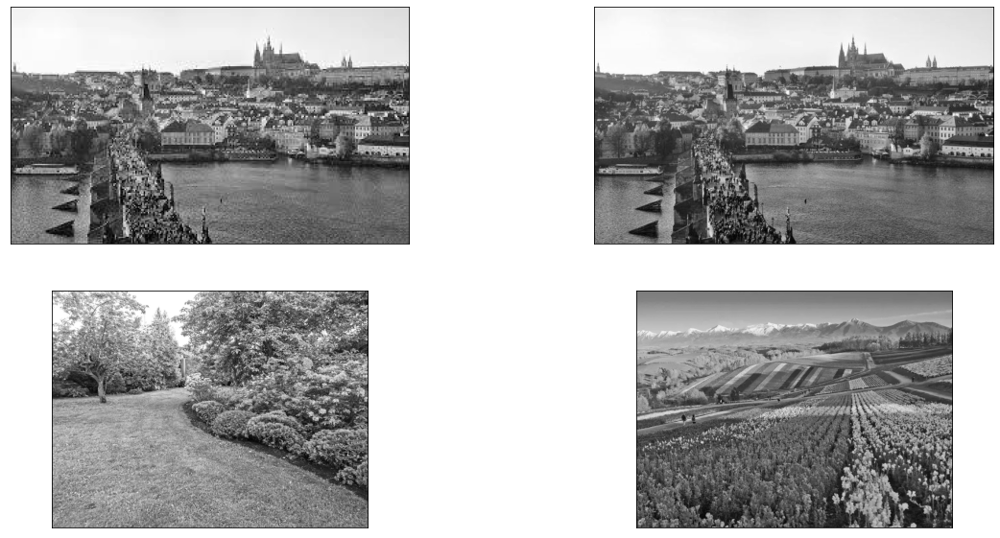

In [5]:
show_images([low_detalization_img, high_detalization_img, low_contrast_img, high_contrast_img])

## 1

In [6]:
K = 1.2
L = -30

In [7]:
def linear_transform(img):
    res = img.astype("int16")
    res = res * K + L
    res[res > 255] = 255
    res[res < 0] = 0
    return res.astype("uint8")

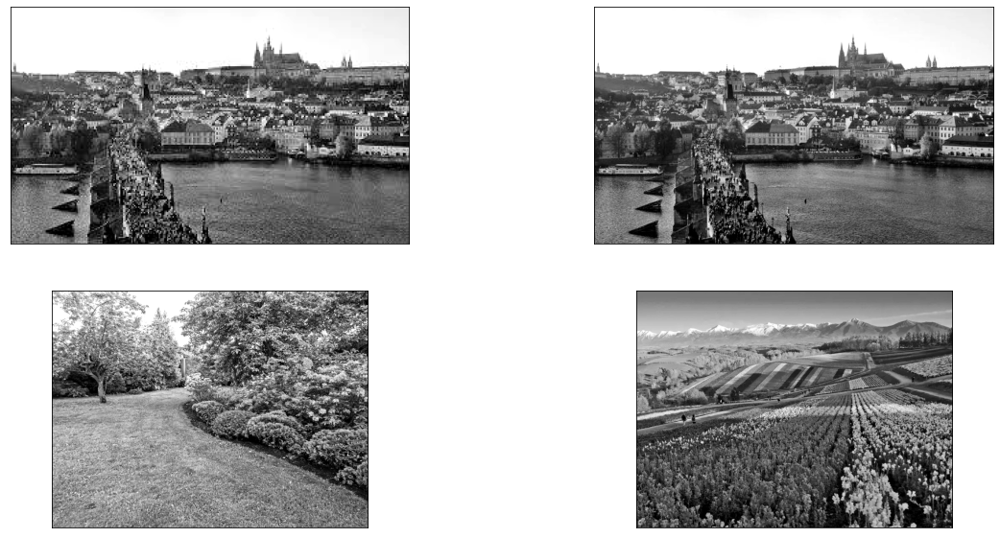

In [8]:
out1 = linear_transform(low_detalization_img)
out2 = linear_transform(high_detalization_img)
out3 = linear_transform(low_contrast_img)
out4 = linear_transform(high_contrast_img)
show_images([out1, out2, out3, out4])

## 2

In [9]:
kernel_size = 5

In [10]:
kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)

In [11]:
def filter2d(img):
    return cv2.filter2D(img, -1, kernel)

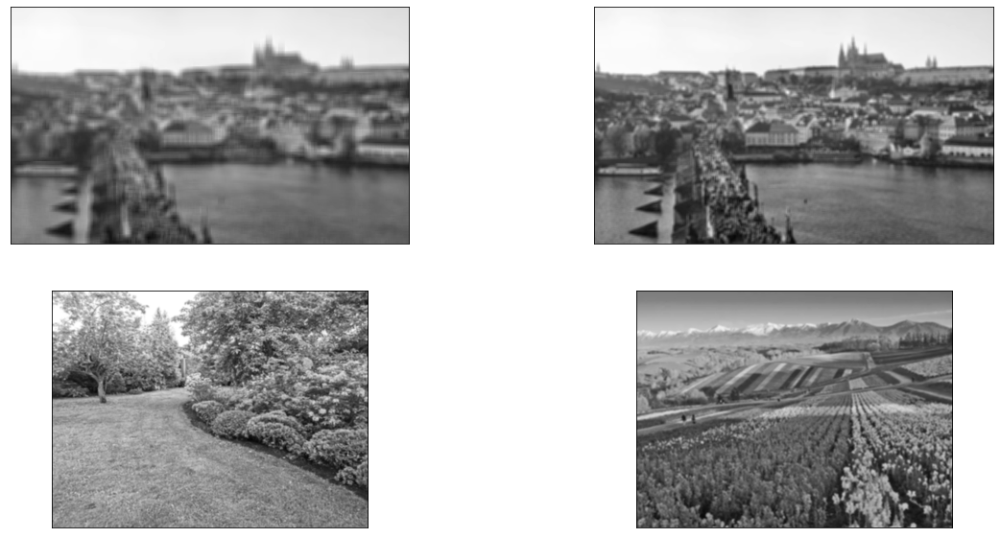

In [12]:
out1 = filter2d(low_detalization_img)
out2 = filter2d(high_detalization_img)
out3 = filter2d(low_contrast_img)
out4 = filter2d(high_contrast_img)
show_images([out1, out2, out3, out4])

## 3

In [13]:
kernel_size = 7

In [14]:
def box_filter(img):
    return cv2.blur(img, (kernel_size, kernel_size))

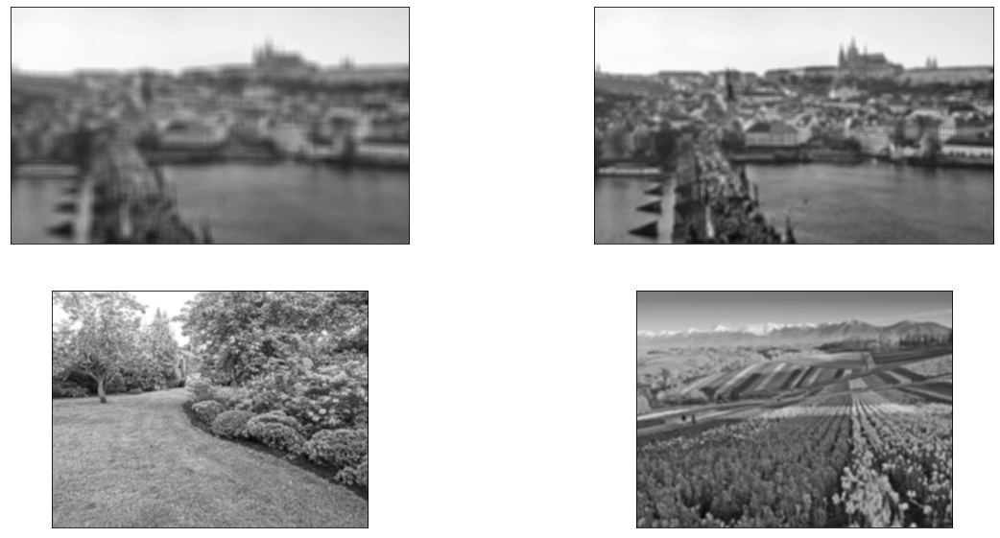

In [15]:
out1 = box_filter(low_detalization_img)
out2 = box_filter(high_detalization_img)
out3 = box_filter(low_contrast_img)
out4 = box_filter(high_contrast_img)
show_images([out1, out2, out3, out4])

## 4

In [16]:
kernel_size = 5

In [17]:
def median_filter(img):
    return cv2.medianBlur(img, kernel_size)

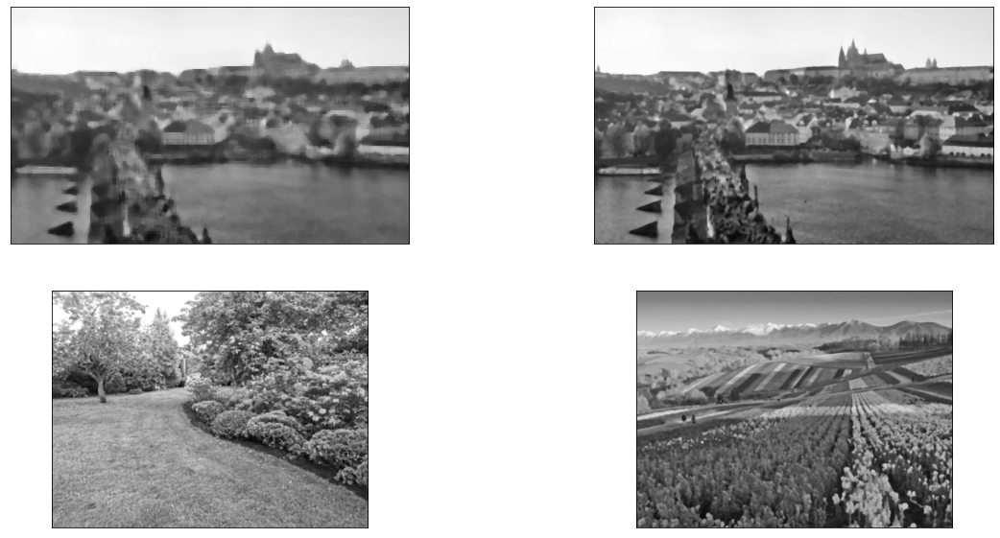

In [18]:
out1 = median_filter(low_detalization_img)
out2 = median_filter(high_detalization_img)
out3 = median_filter(low_contrast_img)
out4 = median_filter(high_contrast_img)
show_images([out1, out2, out3, out4])

## 5

In [19]:
kernel_size = 5

In [20]:
def gausian_blur(img):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

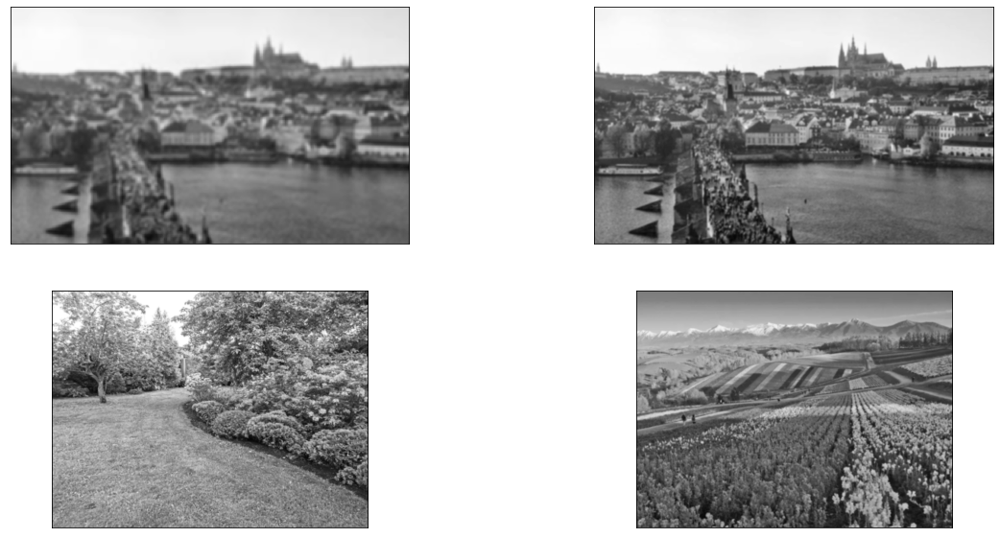

In [21]:
out1 = gausian_blur(low_detalization_img)
out2 = gausian_blur(high_detalization_img)
out3 = gausian_blur(low_contrast_img)
out4 = gausian_blur(high_contrast_img)
show_images([out1, out2, out3, out4])

## 6

In [22]:
val = -25

In [23]:
def show_hist(img1, img2):
    hist1 = cv2.calcHist([img1], [0], None, [256], [0, 256])
    hist2 = cv2.calcHist([img2], [0], None, [256], [0, 256])
    cumsum1 = np.cumsum(hist1)
    cumsum2 = np.cumsum(hist2)
    plt.plot(cumsum1, label="hist")
    plt.plot(cumsum2, label="modified hist")
    plt.xlim([0, 256])
    plt.legend()
    plt.show()

In [24]:
def shift_hist(img):
    res = img.astype("int16")
    res = res + val
    res[res > 255] = 255
    res[res < 0] = 0
    return res.astype("uint8")

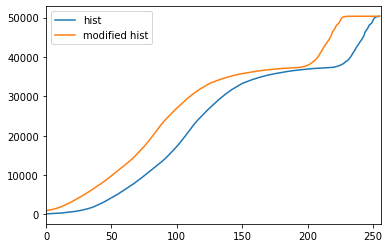

In [25]:
show_hist(low_detalization_img, shift_hist(low_detalization_img))

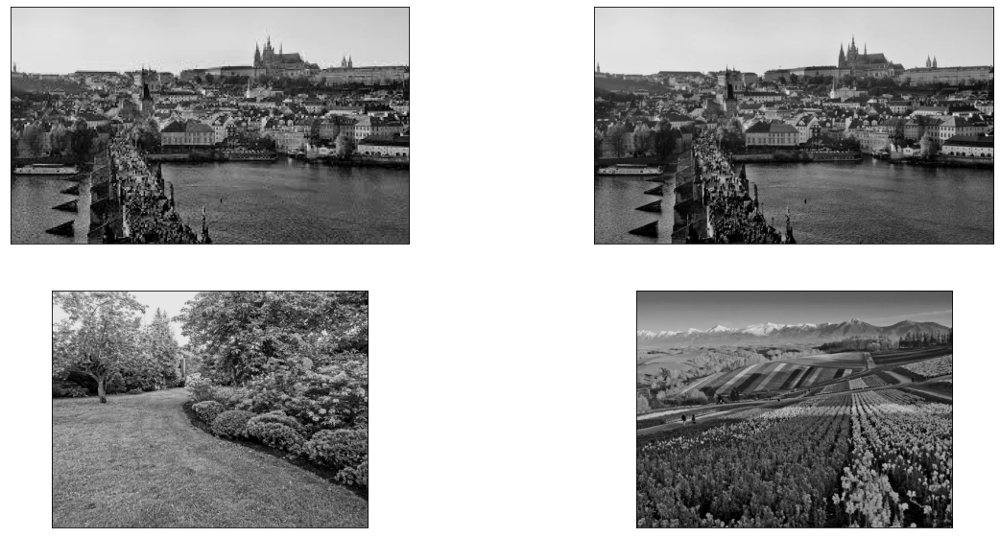

In [26]:
out1 = shift_hist(low_detalization_img)
out2 = shift_hist(high_detalization_img)
out3 = shift_hist(low_contrast_img)
out4 = shift_hist(high_contrast_img)
show_images([out1, out2, out3, out4])

## 7

In [27]:
val = 25

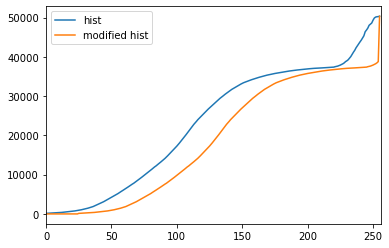

In [28]:
show_hist(low_detalization_img, shift_hist(low_detalization_img))

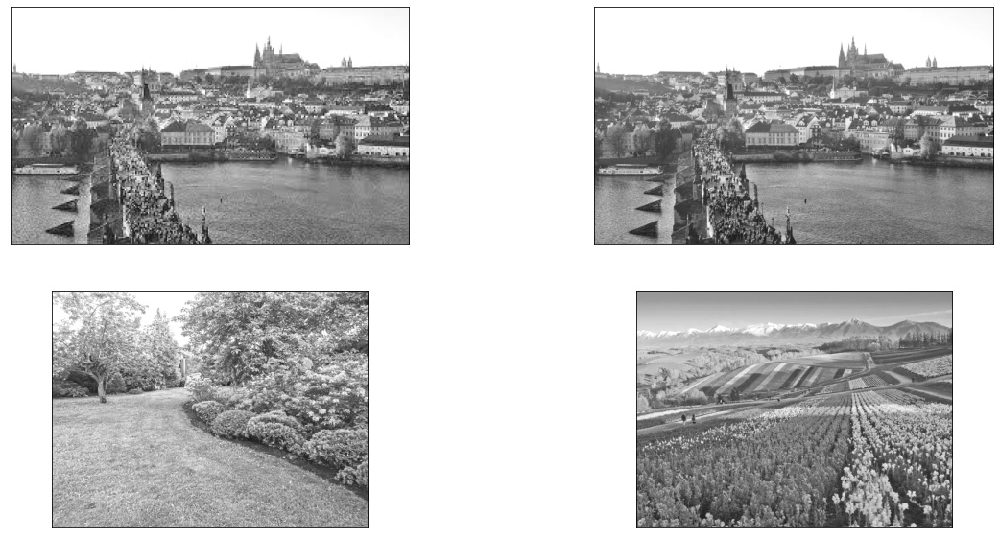

In [29]:
out1 = shift_hist(low_detalization_img)
out2 = shift_hist(high_detalization_img)
out3 = shift_hist(low_contrast_img)
out4 = shift_hist(high_contrast_img)
show_images([out1, out2, out3, out4])

## 8

In [30]:
a = 0.8
s = 10
t = 30

In [31]:
def change_contrast(img):
    res = img.astype("int16")
    res = a * (res - s) + t
    res[res > 255] = 255
    res[res < 0] = 0
    return res.astype("uint8")

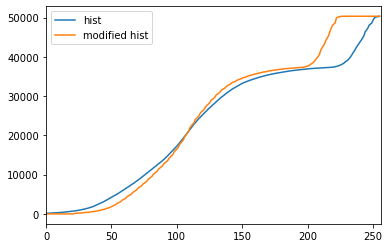

In [32]:
show_hist(low_detalization_img, change_contrast(low_detalization_img))

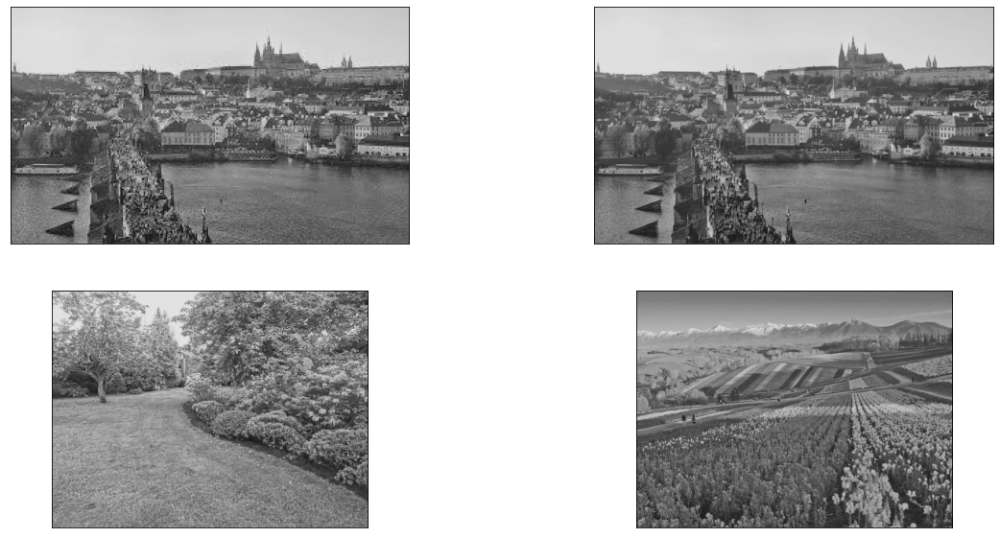

In [33]:
out1 = change_contrast(low_detalization_img)
out2 = change_contrast(high_detalization_img)
out3 = change_contrast(low_contrast_img)
out4 = change_contrast(high_contrast_img)
show_images([out1, out2, out3, out4])

## 9

In [34]:
a = 1.3
s = -10
t = -30

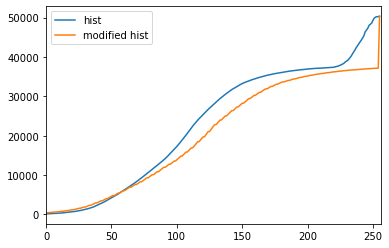

In [35]:
show_hist(low_detalization_img, change_contrast(low_detalization_img))

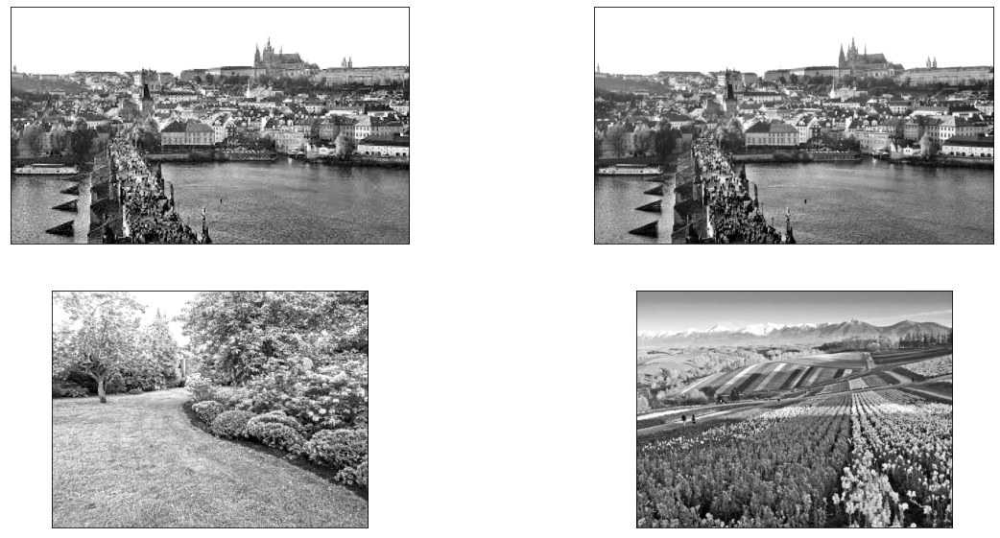

In [36]:
out1 = change_contrast(low_detalization_img)
out2 = change_contrast(high_detalization_img)
out3 = change_contrast(low_contrast_img)
out4 = change_contrast(high_contrast_img)
show_images([out1, out2, out3, out4])

## 10

In [37]:
gamma = 0.4

In [38]:
def gamma_correction(img):
    res = img.astype("int16")
    res = 255 * ((res / 255) ** (gamma))
    res[res > 255] = 255
    res[res < 0] = 0
    return res.astype("uint8")

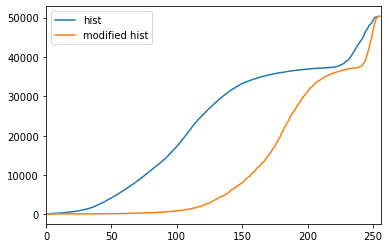

In [39]:
show_hist(low_detalization_img, gamma_correction(low_detalization_img))

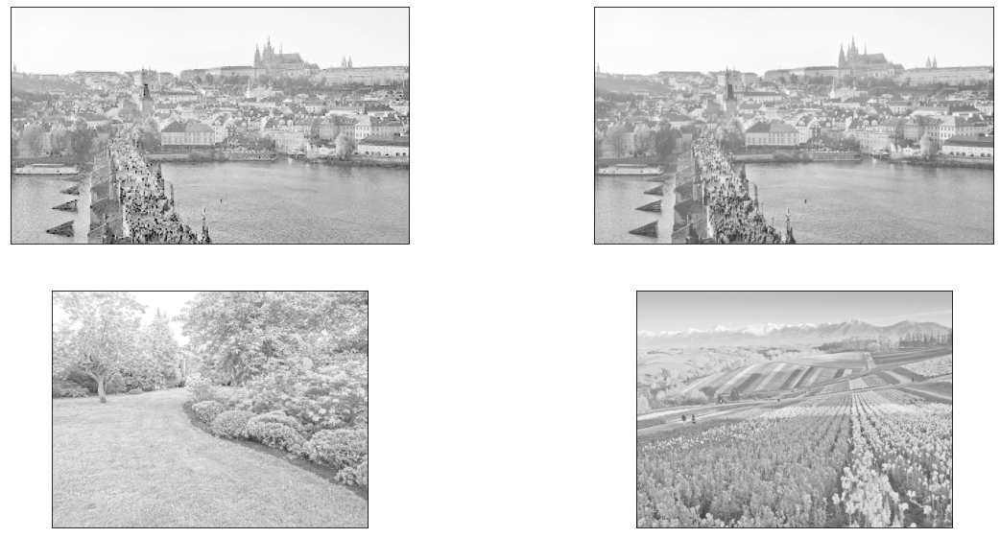

In [40]:
out1 = gamma_correction(low_detalization_img)
out2 = gamma_correction(high_detalization_img)
out3 = gamma_correction(low_contrast_img)
out4 = gamma_correction(high_contrast_img)
show_images([out1, out2, out3, out4])

## 11

In [41]:
gamma = 1.5

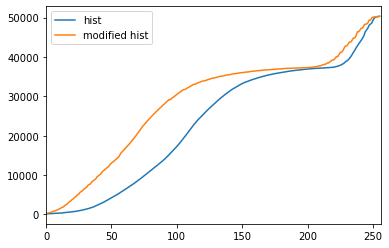

In [42]:
show_hist(low_detalization_img, gamma_correction(low_detalization_img))

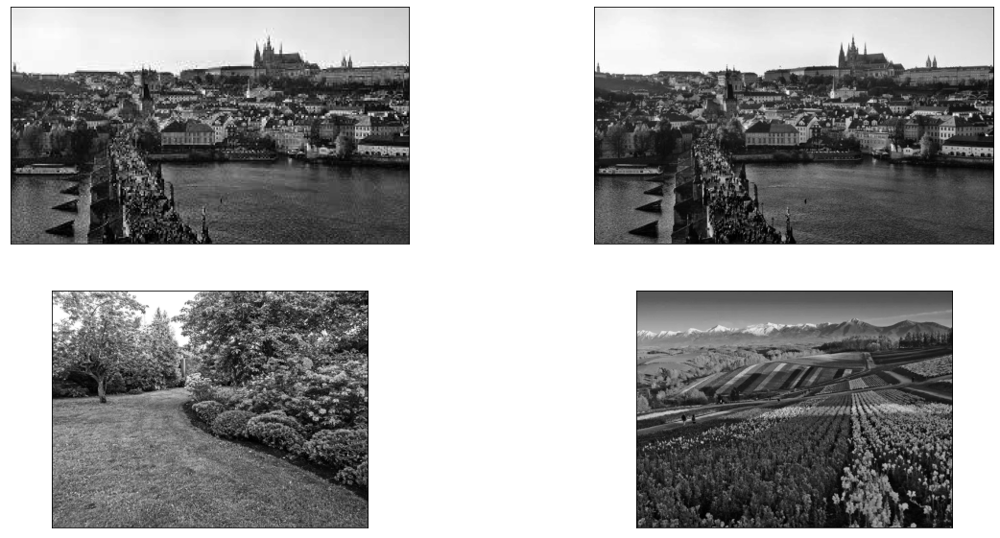

In [43]:
out1 = gamma_correction(low_detalization_img)
out2 = gamma_correction(high_detalization_img)
out3 = gamma_correction(low_contrast_img)
out4 = gamma_correction(high_contrast_img)
show_images([out1, out2, out3, out4])

## 12

In [44]:
def roberts(img):
    kernelx = np.array([[1, 0], [0, -1]])
    kernely = np.array([[0, 1], [-1, 0]])
    img_robertx = cv2.filter2D(img, -1, kernelx)
    img_roberty = cv2.filter2D(img, -1, kernely)
    return cv2.addWeighted(img_robertx, 0.5, img_roberty, 0.5, 0)

In [45]:
def sobel(img):
    return cv2.Sobel(img, -1, 1, 1)

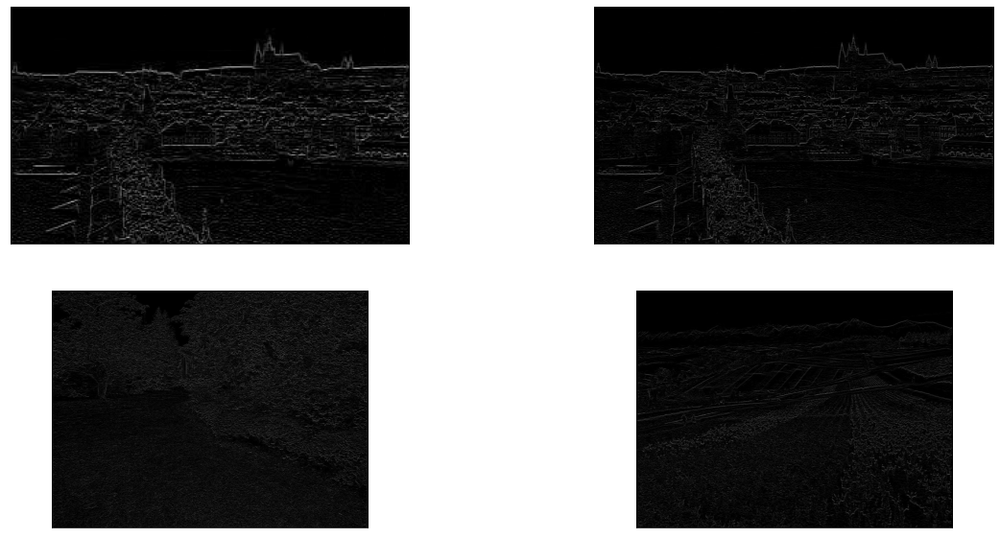

In [46]:
out1 = roberts(low_detalization_img)
out2 = roberts(high_detalization_img)
out3 = roberts(low_contrast_img)
out4 = roberts(high_contrast_img)
show_images([out1, out2, out3, out4])

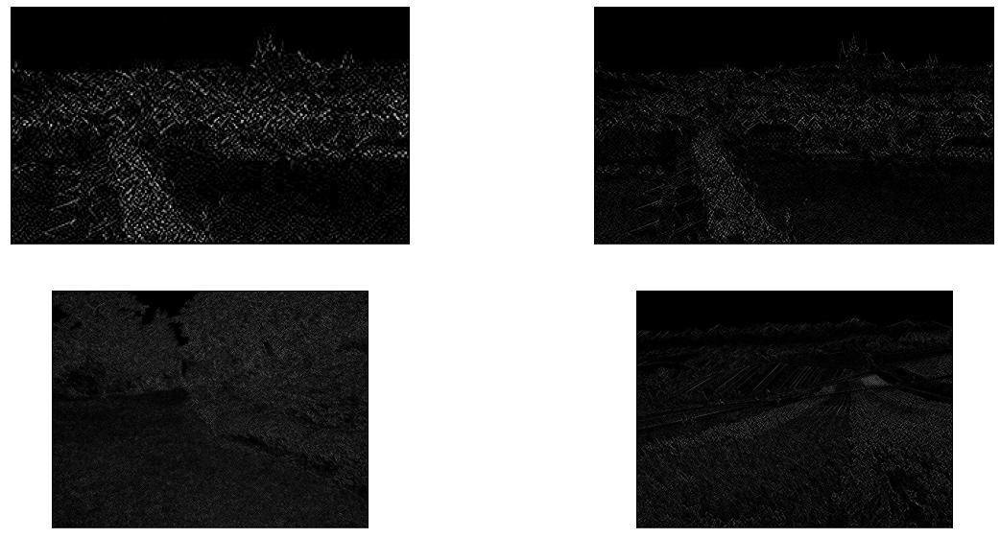

In [47]:
out1 = sobel(low_detalization_img)
out2 = sobel(high_detalization_img)
out3 = sobel(low_contrast_img)
out4 = sobel(high_contrast_img)
show_images([out1, out2, out3, out4])

## 13

In [48]:
def prewitt(img):
    kernelx = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
    kernely = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
    img_prewittx = cv2.filter2D(img, -1, kernelx)
    img_prewitty = cv2.filter2D(img, -1, kernely)
    return cv2.addWeighted(img_prewittx, 0.5, img_prewitty, 0.5, 0)

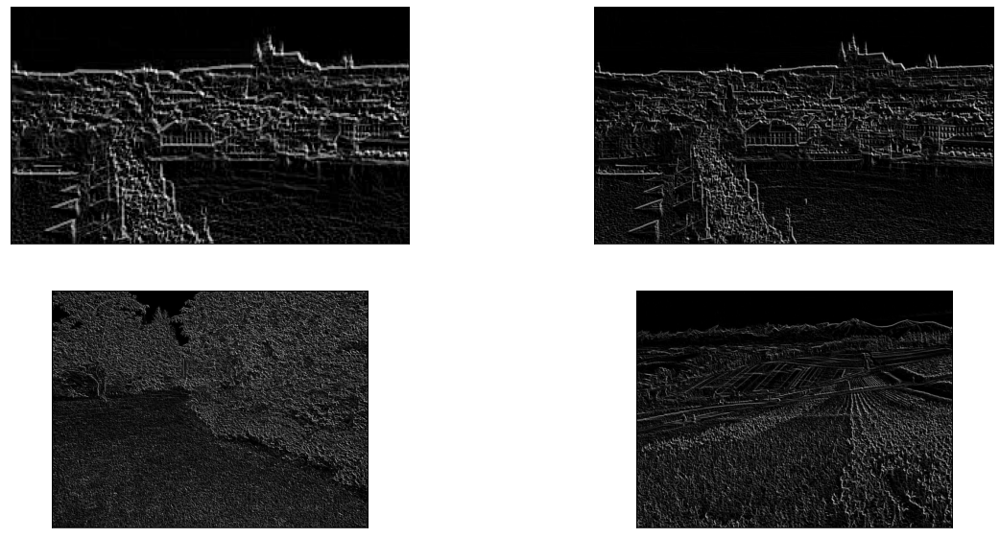

In [49]:
out1 = prewitt(low_detalization_img)
out2 = prewitt(high_detalization_img)
out3 = prewitt(low_contrast_img)
out4 = prewitt(high_contrast_img)
show_images([out1, out2, out3, out4])

## 14

In [50]:
threshold1 = 100
threshold2 = 200

In [51]:
def canny(img):
    return cv2.Canny(img, threshold1, threshold2)

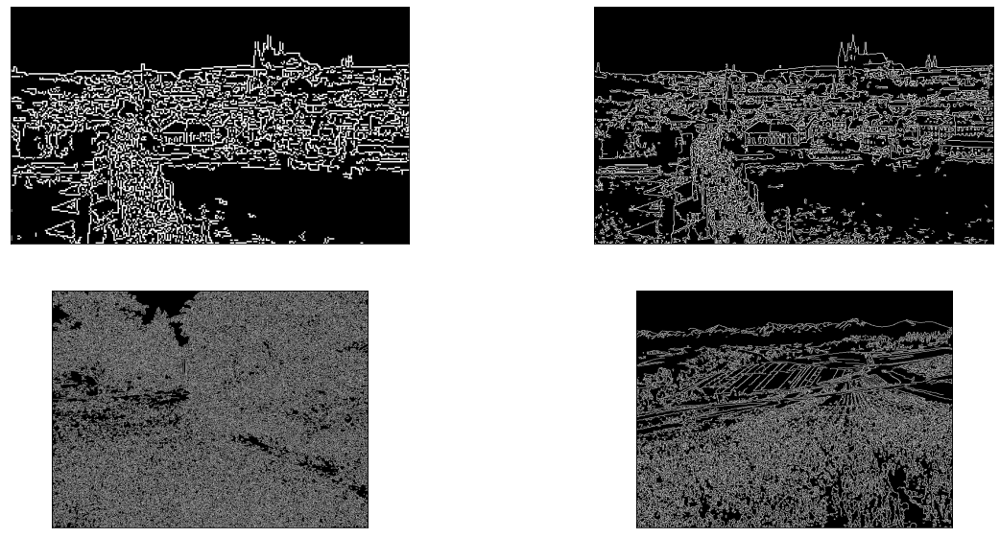

In [52]:
out1 = canny(low_detalization_img)
out2 = canny(high_detalization_img)
out3 = canny(low_contrast_img)
out4 = canny(high_contrast_img)
show_images([out1, out2, out3, out4])

## 15

In [53]:
kirsch_matrices = np.array([
    [[5, 5, 5],
     [-3, 0, -3],
     [-3, -3, -3]],
    [[5, 5, -3],
     [5, 0, -3],
     [-3, -3, -3]],
    [[5, -3, -3],
     [5, 0, -3],
     [5, -3, -3]],
    [[-3, -3, -3],
     [5, 0, -3],
     [5, 5, -3]],
    [[-3, -3, -3],
     [-3, 0, -3],
     [5, 5, 5]],
    [[-3, -3, -3],
     [-3, 0, 5],
     [-3, 5, 5]],
    [[-3, -3, 5],
     [-3, 0, 5],
     [-3, -3, 5]],
    [[-3, 5, 5],
     [-3, 0, 5],
     [-3, -3, -3]]
], dtype="int")

In [54]:
def kirsch(img):
    filtered_imgs = []
    for kirsch_matrix in kirsch_matrices:
        filtered_imgs.append(cv2.filter2D(img, -1, kirsch_matrix))
    filtered_imgs = np.array(filtered_imgs)
    filtered_imgs = filtered_imgs.mean(axis=0)
    return filtered_imgs.astype("uint8")

In [55]:
def laplacian(img):
    return cv2.Laplacian(img, -1)

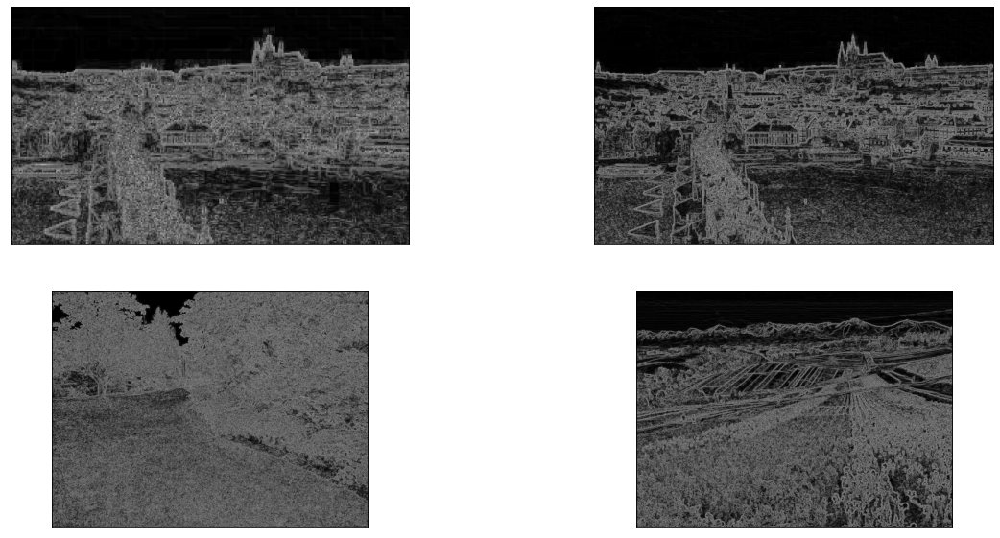

In [56]:
out1 = kirsch(low_detalization_img)
out2 = kirsch(high_detalization_img)
out3 = kirsch(low_contrast_img)
out4 = kirsch(high_contrast_img)
show_images([out1, out2, out3, out4])

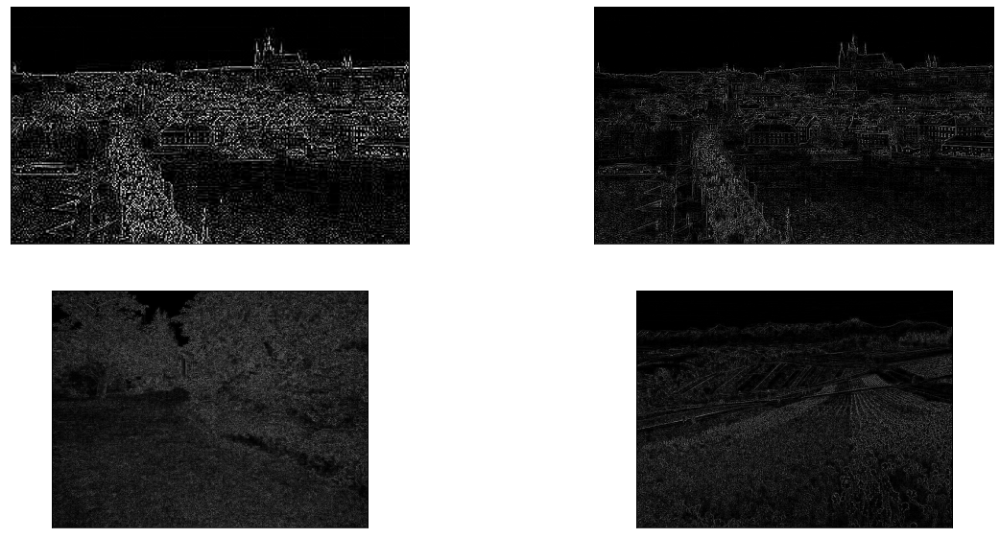

In [57]:
out1 = laplacian(low_detalization_img)
out2 = laplacian(high_detalization_img)
out3 = laplacian(low_contrast_img)
out4 = laplacian(high_contrast_img)
show_images([out1, out2, out3, out4])